# Capstone Project - The Battle of Neighborhoods

## 1. Introduction: Buisness Problem

The aim of this project is to find the optimal location for a supermarkt in Kiel, Germany. There are a lot of supermarkets in Kiel. The aim is to detect the location with the following factors:
* close to a drugstore or pharmacy
* less crowed region with other supermarkets
* no further than 5km away of the city center

In [1]:
#Import necessary libaries

!pip install utm
import utm

!pip install folium
import folium

import pandas as pd
import numpy as np
import math

import matplotlib.pyplot as plt
import matplotlib as mpl
from folium.plugins import HeatMap

import requests
from pandas.io.json import json_normalize   # tranforming json file into a pandas dataframe library

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from textwrap import wrap

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes


## 2. Data Collection and Preparation

### 2.1 Define region of interest

The first step is to define the city center of Kiel. Within step 2 a grid will be created with a cell size of 250m x 250m around the city center. 

### Step 1: Define city center of Kiel

In [2]:
# Step 1: Define city center of Kiel
lon_cc=10.1227652
lat_cc=54.3232927
kiel_center =(lat_cc,lon_cc)
print('Coordinates of Kiel', kiel_center)

Coordinates of Kiel (54.3232927, 10.1227652)


### Step 2: Create grid

In [3]:
# Coordinate transformation to x/y
x_cc,y_cc, zone, ut = utm.from_latlon(kiel_center[0], kiel_center[1])
print('Transfomed coordinates of Kiel (x/y):', x_cc,y_cc)


Transfomed coordinates of Kiel (x/y): 573023.8299499459 6020073.5712018395


In [4]:
# Define grid of cells:
x_min = x_cc - 5000                         # min x
x_max = x_cc + 5000                         # max x
dx = 250                                    # step size in x
x=np.arange(x_min,x_max,dx)                 # cell boarders in x direction

y_min = y_cc - 5000                         # min y
y_max = y_cc + 5000                         # max y
dy = 250                                    # step size in y
y=np.arange(y_min,y_max,dy)                 # cell boarders in y direction


In [5]:
# Create GeoJSON object to visualize the cells
all_cells=[]
for i in range(len(x)):
    for j in range(len(y)):
            # Define dimensions of box in grid + convert to lat/lon
            upper_left = utm.to_latlon(x[i], y[j] + dy,zone, ut) 
            upper_right = utm.to_latlon(x[i] + dx, y[j] + dy,zone, ut) 
            lower_right = utm.to_latlon(x[i] + dx, y[j],zone, ut) 
            lower_left = utm.to_latlon(x[i], y[j],zone, ut)  

            # Define json coordinates for polygon and convert to lat lon
            coordinates = [
                [upper_left[1],upper_left[0]],
                [upper_right[1],upper_right[0]],
                [lower_right[1],lower_right[0]],
                [lower_left[1],lower_left[0]],
                [upper_left[1],upper_left[0]],
            ]

            geo_json = {"type": "FeatureCollection",
                        "properties":{
                            "lower_left": [lower_left[1],lower_left[0]],
                            "upper_right":  [upper_left[1],upper_left[0]]
                        },
                        "features":[]}

            grid_feature = {
                "type":"Feature",
                "geometry":{
                    "type":"Polygon",
                    "coordinates": [coordinates],
                }
            }

            geo_json["features"].append(grid_feature)

            all_cells.append(geo_json)


### Step 3: Plot area of interest

In [6]:
## Not shown to decrease size of file
## Plot
#map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)
#folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)

#color ='#00000000'
#for i, geo_json in enumerate(all_cells):
#    gj = folium.GeoJson(geo_json,
#                        style_function=lambda feature, color=color: {
#                                                                        'fillColor': color,
#                                                                        'color':"black",
#                                                                        'weight': 1,
#                                                                        'dashArray': '5, 5',
#                                                                        'fillOpacity': 0,
#                                                                    })
#    popup = folium.Popup("example popup {}".format(i))
#    gj.add_child(popup)

#    map_kiel.add_child(gj)
#upper_right_corner = utm.to_latlon(x[len(x)-1]+dx, y[len(y)-1]+dy,zone, ut) 
#folium.Marker(upper_right_corner, popup='Kiel Center').add_to(map_kiel)
#map_kiel

### 2.2 Load Data

Foursquare APi is used to get information about supermarkt, drugstore and pharmacy in each neihborhood cell.

In [7]:
# Foursquare credentials
CLIENT_ID = 'xxx' # your Foursquare ID
CLIENT_SECRET = 'xxx' # your Foursquare Secret
ACCESS_TOKEN = 'xxx' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 200
#print('Your credentails:')
#print('CLIENT_ID: ' + CLIENT_ID)
#print('CLIENT_SECRET:' + CLIENT_SECRET)

### Step 1: Search for all supermarkets

In [8]:
# Sear for all supermarkets
categoryId='52f2ab2ebcbc57f1066b8b46' # Catergory: Supermarket
radius= 5000

#Define URL
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, kiel_center[0], kiel_center[1], ACCESS_TOKEN, VERSION, categoryId, radius, LIMIT)

# Send and get requests
result_supermarket = requests.get(url).json()

# Transform into pandas dataframe
supermarket = result_supermarket['response']['venues']

# tranform venues into a dataframe
df_supermarket = json_normalize(supermarket)
#df_supermarket.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:15: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


In [9]:
# Clean dataframe
df_supermarket=df_supermarket.drop(['id','categories','referralId','hasPerk','location.labeledLatLngs','location.distance','location.cc','location.country','location.formattedAddress','venuePage.id','location.neighborhood','location.crossStreet'], axis=1)


In [10]:
df_supermarket.rename(columns={"location.address": "address", "location.lat": "lat","location.lng": "lng", "location.postalCode": "postalCode","location.city": "city", "location.state": "state"},inplace=True)
df_supermarket.head()

,name,address,lat,lng,postalCode,city,state
0,Veganski,Jungfernsteig 28,54.324622,10.123316,24103,Kiel,Schleswig-Holstein
1,REWE,Weißenburgstraße 15,54.325208,10.117955,24116,Kiel,Schleswig-Holstein
2,REWE,Holtenauer Straße 71,54.334245,10.132804,24105,Kiel,Schleswig-Holstein
3,REWE Center,Winterbeker Weg 44,54.308325,10.109708,24114,Kiel,Schleswig-Holstein
4,sky,Holtenauer Str. 71,54.334243,10.132356,24105,Kiel,Schleswig-Holstein


In [11]:
print('By using Foursquare APi {} supermarkets within the area of intersts were found.'.format(len(df_supermarket)))

By using Foursquare APi 50 supermarkets within the area of intersts were found.


### Step 2: Search for all drugstores

In [12]:
drugstore_Id='5745c2e4498e11e7bccabdbd'   # Catergory: drugstore
radius= 5000

#Define URL
url2 = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, kiel_center[0], kiel_center[1], ACCESS_TOKEN, VERSION, drugstore_Id, radius, LIMIT)

# Send and get requests
result_drugstore = requests.get(url2).json()

# Transform into pandas dataframe
drugstore= result_drugstore['response']['venues']

# tranform venues into a dataframe
df_drugstore = json_normalize(drugstore)
#df_drugstore.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:14: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


In [13]:
# Clean dataframe
df_drugstore=df_drugstore.drop(['id','categories','referralId','hasPerk','location.labeledLatLngs','location.distance','location.cc','location.country','location.formattedAddress','venuePage.id','location.crossStreet'], axis=1)


In [14]:
df_drugstore.rename(columns={"location.address": "address", "location.lat": "lat","location.lng": "lng", "location.postalCode": "postalCode","location.city": "city", "location.state": "state"},inplace=True)
df_drugstore.head()

,name,address,lat,lng,postalCode,city,state
0,Rossmann,Weißenburgstr. 21-29,54.325340,10.118420,24116,Kiel,Schleswig-Holstein
1,Rossmann,Am Ihlberg 4,54.301307,10.047539,24109,Melsdorf,Schleswig-Holstein
2,Rossmann,Schönberger Straße 32-34,54.326501,10.183425,24148,Kiel,Schleswig-Holstein
3,Rossmann,Winterbeker Weg 44,54.308900,10.108752,24114,Kiel,Schleswig-Holstein
4,Rossmann,Holtenauer Str. 1,54.329030,10.133489,24105,Kiel,Schleswig-Holstein


In [15]:
print('By using Foursquare APi {} drugstores within the area of intersts were found.'.format(len(df_drugstore)))

By using Foursquare APi 27 drugstores within the area of intersts were found.


### Step 3: Search for all pharmacies

In [16]:
pharmacies_Id='4bf58dd8d48988d10f951735'   # Catergory: pharmacies
radius= 5000

#Define URL
url3 = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, kiel_center[0], kiel_center[1], ACCESS_TOKEN, VERSION, pharmacies_Id, radius, LIMIT)

# Send and get requests
result_pharmacy = requests.get(url3).json()

# Transform into pandas dataframe
pharmacy= result_pharmacy['response']['venues']

# tranform venues into a dataframe
df_pharmacy = json_normalize(pharmacy)
#df_pharmacy.head()

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:14: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead


In [17]:
# Clean dataframe
df_pharmacy=df_pharmacy.drop(['id','categories','referralId','hasPerk','location.labeledLatLngs','location.distance','location.cc','location.country','location.formattedAddress','venuePage.id','location.crossStreet'], axis=1)


In [18]:
df_pharmacy.rename(columns={"location.address": "address", "location.lat": "lat","location.lng": "lng", "location.postalCode": "postalCode","location.city": "city", "location.state": "state"},inplace=True)
df_pharmacy.head()

,name,address,lat,lng,postalCode,city,state
0,Forellen-Apotheke,Hamburger Landstr. 26a,54.286980,10.085543,24113,Molfsee,Schleswig-Holstein
1,Impuls Apotheke,Sophienblatt 36,54.315578,10.130846,24103,Kiel,Schleswig-Holstein
2,Kronen-Apotheke,NaN,54.328792,10.133755,24105,Kiel,Schleswig-Holstein
3,Doc Morris Apotheke,NaN,54.360407,10.133042,24106,Kiel,Schleswig-Holstein
4,Sophien Hof Apotheke Rüdel,Sophienblatt 20,54.316661,10.131395,24103,Kiel,Schleswig-Holstein


In [19]:
print('By using Foursquare APi {} pharmacies within the area of intersts were found.'.format(len(df_pharmacy)))

By using Foursquare APi 40 pharmacies within the area of intersts were found.


### 2.3 Plot Data

A few stores are outside of the area for interest, they need to be discarded.

### 2.4 Data Correction and Visualitzation

In [20]:
# Search for index outside area (supermarket)
i_index=[]
for  i in range(len(df_supermarket)):
    if df_supermarket.iat[i,2] >upper_right[0]:
        i_index.append(i)
    elif df_supermarket.iat[i,3] > upper_right[1]:
        i_index.append(i)
# Drop supermarket out of area
df_supermarket=df_supermarket.drop(df_supermarket.index[i_index])

# Search for index outside area (drugstore)
i_index=[]
for  i in range(len(df_drugstore)):
    if df_drugstore.iat[i,2] >upper_right[0]:
        i_index.append(i)
    elif df_drugstore.iat[i,3] > upper_right[1]:
        i_index.append(i)
# Drop drugstores out of area
df_drugstore=df_drugstore.drop(df_drugstore.index[i_index])

# Search for index outside area (pharmarcy)
i_index=[]
for  i in range(len(df_pharmacy)):
    if df_pharmacy.iat[i,2] >upper_right[0]:
        i_index.append(i)
    elif df_pharmacy.iat[i,3] > upper_right[1]:
        i_index.append(i)
# Drop pharmarcies out of area
df_pharmacy=df_pharmacy.drop(df_pharmacy.index[i_index])

In [21]:
# Plot
map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)

# Display city center
folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)                                 

# Display grid
color ='#00000000'
for i, geo_json in enumerate(all_cells):
    gj = folium.GeoJson(geo_json,
                        style_function=lambda feature, color=color: {
                                                                        'fillColor': color,
                                                                        'color':"black",
                                                                        'weight': 1,
                                                                        'dashArray': '5, 5',
                                                                        'fillOpacity': 0,
                                                                    })
    popup = folium.Popup("example popup {}".format(i))
    gj.add_child(popup)
    map_kiel.add_child(gj)

# Display supermarkets in blue
for i in range(len(df_supermarket)):
    popup=df_supermarket.iat[i,0]
    lat = df_supermarket.iat[i,2] 
    lon = df_supermarket.iat[i,3] 
    supermarkt_marker=folium.CircleMarker([lat, lon], radius=3, color='blue', fill=True, fill_color='blue', fill_opacity=1, popup=popup).add_to(map_kiel)
    
# Display drugstores in red
for i in range(len(df_drugstore)):
    popup=df_drugstore.iat[i,0]
    lat = df_drugstore.iat[i,2] 
    lon = df_drugstore.iat[i,3] 
    drugstore_marker=folium.CircleMarker([lat, lon], radius=3, color='red', fill=True, fill_color='red', fill_opacity=1, popup=popup).add_to(map_kiel)
    
# Display pharmaries in orange
for i in range(len(df_pharmacy)):
    popup=df_pharmacy.iat[i,0]
    lat = df_pharmacy.iat[i,2] 
    lon = df_pharmacy.iat[i,3] 
    pharmacy_marker=folium.CircleMarker([lat, lon], radius=3, color='orange', fill=True, fill_color='orange', fill_opacity=1, popup=popup).add_to(map_kiel)

map_kiel

## 3. Data Analysis

### 3.1 Total Numbers

In [22]:
print('Total number of supermarkets within the area of intersts: {}'.format(len(df_supermarket)))
print('Total number of drugstors within the area of intersts: {}'.format(len(df_drugstore)))
print('Total number of pharmacies within the area of intersts: {}'.format(len(df_pharmacy)))

Total number of supermarkets within the area of intersts: 49
Total number of drugstors within the area of intersts: 26
Total number of pharmacies within the area of intersts: 39


### 3.2 Analyse distance between supermarket and next competitor
The Distance between a supermarket and the next nearest one will be calculated and analyset. Also the number of supermarkets within one cell will be calculated.


##### Preparation

In [23]:
# convert lat/ lon from each supermarkt position to x/y
x_sup=[]
y_sup=[]
for i in range (len(df_supermarket)):
    x_supi,y_supi, zone, ut = utm.from_latlon(df_supermarket.iat[i,2],df_supermarket.iat[i,3])
    x_sup.append(x_supi)
    y_sup.append(y_supi)
df_supermarket['x']=x_sup
df_supermarket['y']=y_sup
del x_sup
del y_sup
#df_supermarket.head()

In [24]:
# Merge drugstore and pharmacy into one dataframe
df_drugstore['type']=('drugstore')
df_pharmacy['type']=('pharmacy')
df_others=df_drugstore
df_others=df_others.append(df_pharmacy)
#df_others

In [25]:
# Convert lat/lon into x/y for all other stores
osx=[]
osy=[]
for i in range (len(df_others)):
    supm_x, supm_y, zone, ut=utm.from_latlon(df_others.iat[i,2],df_others.iat[i,3]) 
    osx.append(supm_x)
    osy.append(supm_y)
df_others['x']=osx
df_others['y']=osy
del osx
del osy
#df_others.head()

##### Analyse distance between supermarkt and next competitor


In [26]:
# Define functions to calculate distance in x/y:
def calc_xy_dis(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

In [27]:
# Calculate distance for all supermarkets to nearest competitor
distance_to_competitor=[]

for i in range (len(df_supermarket)):
    min_distance=99999
    for j in range (len(df_supermarket)):
        distance = calc_xy_dis(df_supermarket.iat[i,7], df_supermarket.iat[i,8],df_supermarket.iat[j,7],df_supermarket.iat[j,8])
        if distance<min_distance and distance!=0:
            min_distance=distance
    distance_to_competitor.append(min_distance)

df_supermarket['sm_2_competitor']=distance_to_competitor
del distance_to_competitor


In [28]:
# Average, min, max distance
print('Average distance between supermarkt and competitor: {}m'.format(df_supermarket['sm_2_competitor'].mean()))
print('Minimum distance between supermarkt and competitor: {}m'.format(df_supermarket['sm_2_competitor'].min()))
print('Maximum distance between supermarkt and competitor: {}m'.format(df_supermarket['sm_2_competitor'].max()))

Average distance between supermarkt and competitor: 480.92312418383m
Minimum distance between supermarkt and competitor: 9.825852976011097m
Maximum distance between supermarkt and competitor: 1854.7974099184894m


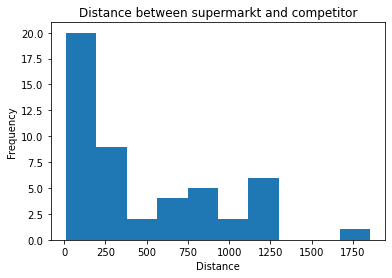

In [29]:
# Display Histogram
plt.hist(df_supermarket['sm_2_competitor'], bins=10)
plt.title("Distance between supermarkt and competitor")
plt.xlabel("Distance")
plt.ylabel("Frequency")
plt.show()

##### Calculate number of supermarkets per cell

In [30]:
#Prepare dataframe containing mitpoint of each cell as well as a hit count column for supermarket
cell_lat_mid=[]
cell_lon_mid=[]
cell_x_mid=[]
cell_y_mid=[]
hit_count_supermarkt=[]


for i in range (len(x)):
    for j in range (len(y)):
        xi=x[i]+dx/2
        yj=y[j]+dy/2
        mid_lat_lon =utm.to_latlon(xi,yj,zone, ut)
        
        cell_x_mid.append(xi)
        cell_y_mid.append(yj)
        cell_lat_mid.append(mid_lat_lon[0])
        cell_lon_mid.append(mid_lat_lon[1])
        hit_count_supermarkt.append(0)
        #cell_x_mid[len(cell_x_mid):]=[xi]
        #cell_y_mid[len(cell_y_mid):]=[yi]
        #cell_lat_mid[len(cell_lat_mid):]=[mid_lat_lon[0]]
        #cell_lon_mid[len(cell_lon_mid):]=[mid_lat_lon[1]]
        #hit_count_supermarkt[len(hit_count_supermarkt):]=[0]
    
df_cell=pd.DataFrame(list(zip(cell_x_mid,cell_y_mid,cell_lat_mid,cell_lon_mid,hit_count_supermarkt)), columns=['cell_x_mid','cell_y_mid','cell_lat_mid','cell_lon_mid','hit_count_supermarkt'])

del cell_lat_mid
del cell_lon_mid
del cell_x_mid
del cell_y_mid
del hit_count_supermarkt


# Count supermarkets for each cell
for m in range (len(df_supermarket)):
    for i in range (len(x)):
        for j in range (len(y)):
            if df_supermarket.iat[m,7]>=x[i] and df_supermarket.iat[m,8]>=y[j] and df_supermarket.iat[m,7]<x[i]+dx and df_supermarket.iat[m,8]<y[j]+dy:
                df_cell.iat[i*len(y)+j,4]=df_cell.iat[i*len(y)+j,4]+1
#df_cell.head()

In [31]:
# Average, min, max distance
print('Average amount of supermarkets per cell: {}m'.format(df_cell['hit_count_supermarkt'].mean()))
print('Minimum amount of supermarkets per cell: {}m'.format(df_cell['hit_count_supermarkt'].min()))
print('Maximum amount of supermarkets per cell: {}m'.format(df_cell['hit_count_supermarkt'].max()))

Average amount of supermarkets per cell: 0.03m
Minimum amount of supermarkets per cell: 0m
Maximum amount of supermarkets per cell: 2m


### 3.3 Analyse the distance between supermarket and next drugstore/pharmacy
Within the first stept the distance between supermarket and nearest durgstore or pharmacy will be calculated and analysed. Due to the behavoiur of people the walk in effect might be different for areas close to the city center and those further away. Peoply further away from the city center are used to have longer ways. Therfore the relationship between distance supermarkt to drugstore/pharmacy and supermarkt to city center will be analysed within the second step.

#### 3.3.1 Calculate distance between supermarkt and next drugstore/pharmacy

In [32]:
# Calculate distance for all supermarkets to nearest drugstore/ pharmacy
distance_to_nearest_store=[]

for i in range (len(df_supermarket)):
    min_distance=99999
    for j in range (len(df_others)):
        distance = calc_xy_dis(df_supermarket.iat[i,7], df_supermarket.iat[i,8],df_others.iat[j,8],df_others.iat[j,9])
        if distance<min_distance:
            min_distance=distance
    distance_to_nearest_store.append(min_distance)

df_supermarket['sm_2_other_store']=distance_to_nearest_store
del distance_to_nearest_store
#df_supermarket.head()

In [33]:
# Average, min, max distance
print('Average distance between supermarkt and drugstore/pharmacy: {}m'.format(df_supermarket['sm_2_other_store'].mean()))
print('Minimum distance between supermarkt and drugstore/pharmacy: {}m'.format(df_supermarket['sm_2_other_store'].min()))
print('Maximum distance between supermarkt and drugstore/pharmacy: {}m'.format(df_supermarket['sm_2_other_store'].max()))

Average distance between supermarkt and drugstore/pharmacy: 400.0843657074836m
Minimum distance between supermarkt and drugstore/pharmacy: 6.663566262029321m
Maximum distance between supermarkt and drugstore/pharmacy: 1897.5398548844705m


#### 3.3.2 Distance between Supermarket and City Center

In [34]:
# Calculate distance for all supermarkets to city center
sm_2_cc=[]

for i in range (len(df_supermarket)):
    min_distance=99999
    supm_x, supm_y, zone, ut=utm.from_latlon(df_supermarket.iat[i,2],df_supermarket.iat[i,3]) 
    distance = calc_xy_dis(supm_x,supm_y,x_cc,y_cc)
    if distance<min_distance:
            min_distance=distance
    sm_2_cc.append(min_distance)

df_supermarket['sm_2_cc']=sm_2_cc
del sm_2_cc
#df_supermarket.head()

In [35]:
# Average, min, max distance
print('Average distance between supermarkt and city center: {}m'.format(df_supermarket['sm_2_cc'].mean()))
print('Minimum distance between supermarkt and city center: {}m'.format(df_supermarket['sm_2_cc'].min()))
print('Maximum distance between supermarkt and city center: {}m'.format(df_supermarket['sm_2_cc'].max()))

Average distance between supermarkt and city center: 2690.9467068832655m
Minimum distance between supermarkt and city center: 152.1930633194878m
Maximum distance between supermarkt and city center: 5401.632353570672m


#### 3.3.3 Relationship between 'Distance Supermarket and City Center' and 'Distance Supermarkt and Drugstore/ Pharmacy'

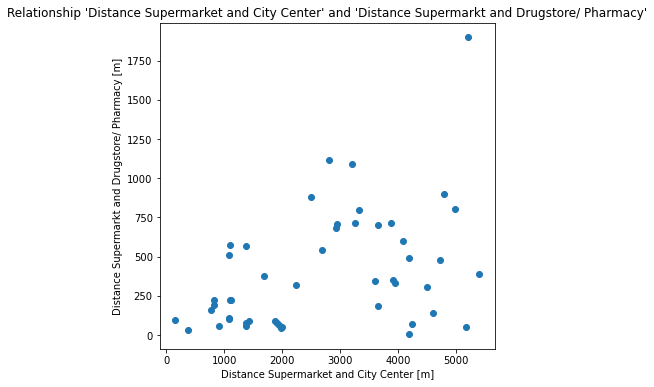

In [36]:
plt.figure(figsize=(6, 6))
plt.scatter(df_supermarket['sm_2_cc'],df_supermarket['sm_2_other_store'])
plt.title("Relationship 'Distance Supermarket and City Center' and 'Distance Supermarkt and Drugstore/ Pharmacy'")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.show()

###  Calculation for each cell

In [37]:
# Calculate Distance of each cell to nearest supermarkt
df_cell['cell_2_supermarkt']=np.linspace(0,0, len(df_cell))

distance_cell_sup=[]
for i in range (len(df_cell)):
    min_distance=999999999
    for m in range (len(df_supermarket)):
        distance = calc_xy_dis(df_cell.iat[i,0],df_cell.iat[i,1],df_supermarket.iat[m,7],df_supermarket.iat[m,8])
        if distance<min_distance:
            min_distance=distance
    df_cell.iat[i,5]=min_distance
    
del  distance_cell_sup   

#df_cell.tail()

In [38]:
# Calculate Distance of each cell to drugstore/pharmacy
df_cell['cell_2_other_store']=np.linspace(0,0, len(df_cell))

distance_cell_store=[]
for i in range (len(df_cell)):
    min_distance=999999999
    for m in range (len(df_others)):
        distance = calc_xy_dis(df_cell.iat[i,0],df_cell.iat[i,1],df_others.iat[m,8],df_others.iat[m,9])
        if distance<min_distance:
            min_distance=distance
    df_cell.iat[i,6]=min_distance

del distance_cell_store

#df_cell.tail()

## 4. Modelling

The target area should be close to a drugstore or pharmacy dependend on the distance to the city center and within a less grouded supermarkt region. For the first factor the relationship between 'distance between supermarkt and pharmacy/ drugstore' and ' distance between supermarkt and city center' needs to be analysied and modelled. As seen in a plot before a polynomial regession is needed.

### 4.1 Decission Factor 1: Close to Drugstore/ Pharmacy

#### Polynomial Regression

Best degree 9 with RMSE 211.85095675812775


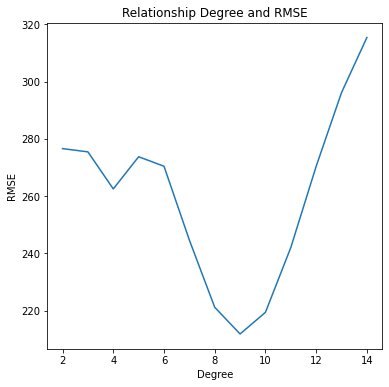

In [57]:
# find best degree
x_train, x_test, y_train, y_test = train_test_split(df_supermarket[['sm_2_cc']], df_supermarket['sm_2_other_store'], test_size=0.3)
rmses = []
degrees = np.arange(2, 15)
min_rmse, min_deg = 1e10, 0

for deg in degrees:

    # Train features
    poly_features = PolynomialFeatures(degree=deg, include_bias=False)
    x_poly_train = poly_features.fit_transform(x_train)

    # Linear regression
    poly_reg = LinearRegression()
    poly_reg.fit(x_poly_train, y_train)

    # Compare with test data
    x_poly_test = poly_features.fit_transform(x_test)
    poly_predict = poly_reg.predict(x_poly_test)
    poly_mse = mean_squared_error(y_test, poly_predict)
    poly_rmse = np.sqrt(poly_mse)
    rmses.append(poly_rmse)
    
    # Cross-validation of degree
    if min_rmse > poly_rmse:
        min_rmse = poly_rmse
        min_deg = deg
        
# Plot and present results
print('Best degree {} with RMSE {}'.format(min_deg, min_rmse))
plt.figure(figsize=(6, 6))
plt.title("Relationship Degree and RMSE")
plt.xlabel("Degree")
plt.ylabel("RMSE")
plt.plot(degrees, rmses)
plt.show()

In [40]:
# Polynomial regression with best degree
y_train_all=df_supermarket['sm_2_other_store']
x_train_all=df_supermarket[['sm_2_cc']]
x_test_all=pd.DataFrame(np.linspace(df_supermarket['sm_2_cc'].min(),df_supermarket['sm_2_cc'].max(),100),columns=['xtest'])

# Train features with best degree
poly_features_best = PolynomialFeatures(degree=min_deg, include_bias=False)
x_poly_train_all = poly_features_best.fit_transform(x_train_all)

# Linear regression
poly_reg_best = LinearRegression()
poly_reg_best.fit(x_poly_train_all, y_train_all)

#Prediction with best degree
y_pred_all=poly_reg_best.predict(poly_features_best.fit_transform(x_test_all))

#Plot Data and Regression
#plt.figure(figsize=(8, 8))
#plt.scatter(x_train_all,y_train_all)
#plt.title("\n".join(wrap("Relationship 'Supermarket to City Center' & 'Supermarkt to Drugstore/ Pharmacy'", 70)))
#plt.xlabel("Distance Supermarket and City Center [m]")
#plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
#plt.plot(x_test_all,y_pred_all,'r')
#plt.show()

For higher distances the model seems to be overfitted. Lower degrees give the following results

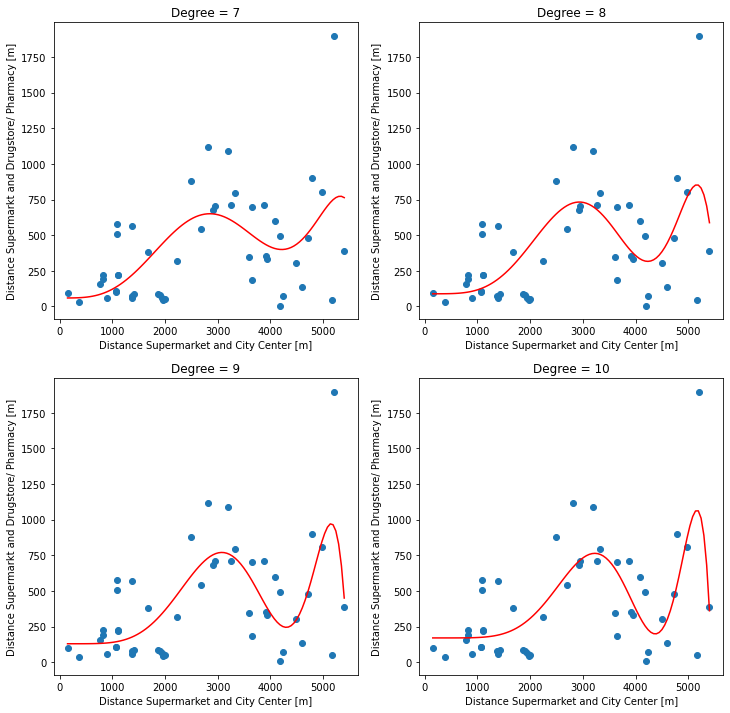

In [41]:
# Train features with best degree
poly_features7 = PolynomialFeatures(degree=7, include_bias=False)
x_poly_train7 = poly_features7.fit_transform(x_train_all)

poly_features8 = PolynomialFeatures(degree=8, include_bias=False)
x_poly_train8 = poly_features8.fit_transform(x_train_all)

poly_features9 = PolynomialFeatures(degree=9, include_bias=False)
x_poly_train9 = poly_features9.fit_transform(x_train_all)

poly_features10 = PolynomialFeatures(degree=10, include_bias=False)
x_poly_train10 = poly_features10.fit_transform(x_train_all)

# Linear regression
poly_reg7 = LinearRegression()
poly_reg7.fit(x_poly_train7, y_train_all)

poly_reg8 = LinearRegression()
poly_reg8.fit(x_poly_train8, y_train_all)

poly_reg9 = LinearRegression()
poly_reg9.fit(x_poly_train9, y_train_all)

poly_reg10 = LinearRegression()
poly_reg10.fit(x_poly_train10, y_train_all)

#Prediction with best degree
y_pred7=poly_reg7.predict(poly_features7.fit_transform(x_test_all))
y_pred8=poly_reg8.predict(poly_features8.fit_transform(x_test_all))
y_pred9=poly_reg9.predict(poly_features9.fit_transform(x_test_all))
y_pred10=poly_reg10.predict(poly_features10.fit_transform(x_test_all))

#Plot Data and Regression
plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
plt.scatter(x_train_all,y_train_all)
plt.title("Degree = 7")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.plot(x_test_all,y_pred7,'r')

plt.subplot(2,2,2)
plt.scatter(x_train_all,y_train_all)
plt.title("Degree = 8")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.plot(x_test_all,y_pred8,'r')

plt.subplot(2,2,3)
plt.scatter(x_train_all,y_train_all)
plt.title("Degree = 9")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.plot(x_test_all,y_pred9,'r')

plt.subplot(2,2,4)
plt.scatter(x_train_all,y_train_all)
plt.title("Degree = 10")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.plot(x_test_all,y_pred10,'r')

plt.show()


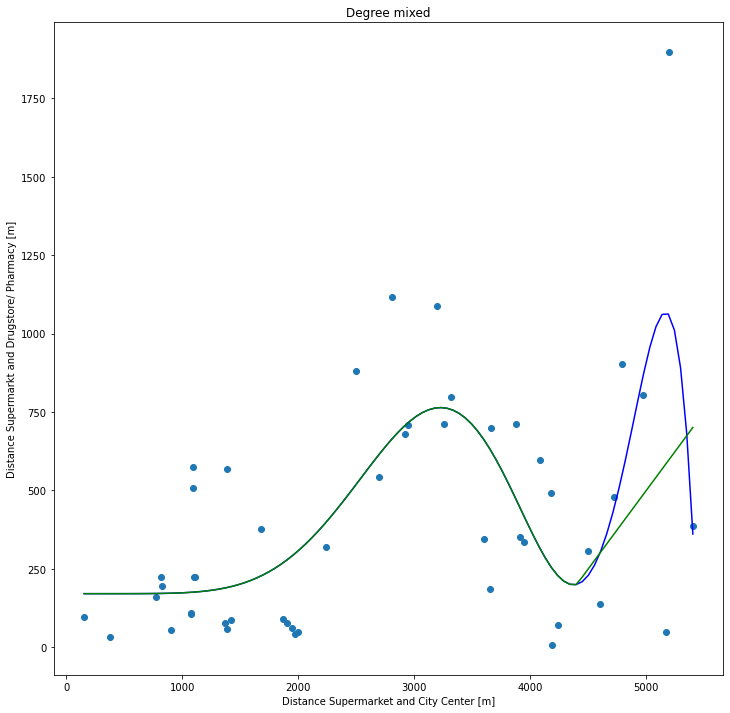

In [42]:
y_mix=np.linspace(0,0,len(y_pred_all))
x_mix=np.linspace(df_supermarket['sm_2_cc'].min(),df_supermarket['sm_2_cc'].max(),100)

for i in range (len(x_test_all)):
    if x_mix[i]<4400:
        y_mix[i]=y_pred10[i]
    elif x_mix[i]>=4400:
        y_mix[i]=0.5*x_mix[i]-2000
        
plt.figure(figsize=(12,12))
plt.scatter(x_train_all,y_train_all)
plt.title("Degree mixed")
plt.xlabel("Distance Supermarket and City Center [m]")
plt.ylabel("Distance Supermarkt and Drugstore/ Pharmacy [m]")
plt.plot(x_test_all,y_pred10,'b')
plt.plot(x_test_all,y_mix,'g')
plt.show()

In [43]:
# Calculate distance cell two city center
df_cell['cell_2_cc']=np.linspace(0,0, len(df_cell))
for i in range (len(df_cell)):
    df_cell.iat[i,7]=(calc_xy_dis(df_cell.iat[i,0],df_cell.iat[i,1],x_cc,y_cc))
    
    
#df_cell.head()

In [44]:
# Calculate max distance to nearest store 
df_cell['max_cell_2_store']=np.linspace(0,0, len(df_cell))

#Prediction
y_cell_pred10=poly_reg10.predict(poly_features10.fit_transform(df_cell[['cell_2_cc']]))

#Merge
for i in range (len(df_cell)):
    if df_cell.iat[i,7]<4400:
        df_cell.iat[i,8]=y_cell_pred10[i]
    elif df_cell.iat[i,7]>=4400:
        df_cell.iat[i,8]=0.5*df_cell.iat[i,7]-2000
#df_cell.head()

In [45]:
# Calculate score for factore 1
df_cell['score 1']=np.linspace(0,0, len(df_cell))

for i in range (len(df_cell)):
    if df_cell.iat[i,6]<=df_cell.iat[i,8]:
        df_cell.iat[i,9]=1
    elif df_cell.iat[i,6]>df_cell.iat[i,8]:
        df_cell.iat[i,9]=0
        
#df_cell.head()

In [46]:
## Not shown to decrease size of file
## Create Map: Score for polynomial regreesion.

## Plot
#map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)

# Display city center
#folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)                                 

# Display grid
#color ='#00000000'
#for i, geo_json in enumerate(all_cells):
    
    # Defin gird color based on no of restaurants
#    color = plt.cm.Reds(df_cell.iat[i,9])
#    color = mpl.colors.to_hex(color)
    
#    gj = folium.GeoJson(geo_json,
#                        style_function=lambda feature, color=color: {
#                                                                        'fillColor': color,
#                                                                        'color':"black",
#                                                                        'weight': 1,
#                                                                        'dashArray': '5, 5',
#                                                                        'fillOpacity': 0.55,
#                                                                    })
#    popup = folium.Popup("example popup {}".format(i))
#    gj.add_child(popup)
#    map_kiel.add_child(gj)


  

## Display drugstores in red
#for i in range(len(df_drugstore)):
#    popup=df_drugstore.iat[i,0]
#    lat = df_drugstore.iat[i,2] 
#    lon = df_drugstore.iat[i,3] 
#    drugstore_marker=folium.CircleMarker([lat, lon], radius=3, color='red', fill=True, fill_color='red', fill_opacity=1, popup=popup).add_to(map_kiel)
    
## Display pharmaries in orange
#for i in range(len(df_pharmacy)):
#    popup=df_pharmacy.iat[i,0]
#    lat = df_pharmacy.iat[i,2] 
#    lon = df_pharmacy.iat[i,3] 
#    pharmacy_marker=folium.CircleMarker([lat, lon], radius=3, color='red', fill=True, fill_color='red', fill_opacity=1, popup=popup).add_to(map_kiel)

#map_kiel

### 4.2 Decission Factor 2: Less crowded supermarkt region

With the second factor areas with less supermarkets where searched. In other words areas within a distance of 250m to another supermarket where dropped.

In [47]:
# Calculate score for factore 2
df_cell['score 2']=np.linspace(0,0, len(df_cell))

for i in range (len(df_cell)):
    if df_cell.iat[i,5]>300:
        df_cell.iat[i,10]=1
        
#df_cell.head()

In [48]:
## Not shown to decrease size of file
## Create heat map: Hit Count Supermarkt

## Plot
#map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)

## Display city center
#folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)                                 

## Display grid
#color ='#00000000'
#for i, geo_json in enumerate(all_cells):
    
#    # Defin gird color based on no of restaurants
#    color = plt.cm.Reds(df_cell.iat[i,10])
#    color = mpl.colors.to_hex(color)
#    
#    gj = folium.GeoJson(geo_json,
#                        style_function=lambda feature, color=color: {
#                                                                        'fillColor': color,
#                                                                        'color':"black",
#                                                                        'weight': 1,
#                                                                        'dashArray': '5, 5',
#                                                                        'fillOpacity': 0.55,
#                                                                    })
#    popup = folium.Popup("example popup {}".format(i))
#    gj.add_child(popup)
#    map_kiel.add_child(gj)



## Display supermarkets in blue
#for i in range(len(df_supermarket)):
#    popup=df_supermarket.iat[i,0]
#    lat = df_supermarket.iat[i,2] 
#    lon = df_supermarket.iat[i,3] 
#    supermarkt_marker=folium.CircleMarker([lat, lon], radius=3, color='blue', fill=True, fill_color='blue', fill_opacity=1, popup=popup).add_to(map_kiel)
    
#map_kiel

### 4.3 Define region of interest: Total Score

In [49]:
# Calculate score for factore 2
df_cell['total_score']=(df_cell['score 1']+df_cell['score 2'])/2
for i in range (len(df_cell)):
    if df_cell.iat[i,11]<1:
        df_cell.iat[i,11]=0
        
#df_cell.head()

In [50]:
## Not shown to decrease size of file
## Create heat map: Hit Count Supermarkt

## Plot
#map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)

## Display city center
#folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)                                 

## Display grid
#color ='#00000000'
#for i, geo_json in enumerate(all_cells):
    
#    # Defin gird color based on no of restaurants
#    color = plt.cm.Reds(df_cell.iat[i,11])
#    color = mpl.colors.to_hex(color)
    
#    gj = folium.GeoJson(geo_json,
#                        style_function=lambda feature, color=color: {
#                                                                        'fillColor': color,
#                                                                        'color':"black",
#                                                                        'weight': 1,
#                                                                        'dashArray': '5, 5',
#                                                                        'fillOpacity': 0.55,
#                                                                    })
#    popup = folium.Popup("example popup {}".format(i))
#    gj.add_child(popup)
#    map_kiel.add_child(gj)

    
#map_kiel

### 4.5 Define Cluster and theier Midpoint 

#### DB Scan

In [51]:
# Test db scan
good_cell=df_cell[df_cell['total_score']==1]
good_cell=good_cell[['cell_x_mid','cell_y_mid']].values

db = DBSCAN(eps=400, min_samples=5).fit(good_cell)
labels = db.labels_

no_clusters = len(np.unique(labels) )
no_noise = np.sum(np.array(labels) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)


Estimated no. of clusters: 11
Estimated no. of noise points: 26


In [52]:
# Add cluster information (label) to all "good cells"/ area of interest
good_cell_df=pd.DataFrame(good_cell,columns=['cell_x_mid','cell_y_mid'])
good_cell_df['labels']=labels+2    # Add 2 --> 1 no cluster, 2 first cluster


# merge to cell dataframe
df_cell=pd.merge(df_cell,good_cell_df, on=['cell_x_mid','cell_y_mid'], how='outer')
# Set nan to zero --> 0 Area of no interest
df_cell['labels']= df_cell['labels'].fillna(0)

In [53]:
#Calculate Centroids
points_of_cluster=0
centroid=(0,0)
cluster_centers=[]


for i in range (no_clusters-1):
    points_of_cluster=good_cell[labels==i,:]
    centroid=np.mean(points_of_cluster, axis=0)
    cluster_centers.append(utm.to_latlon(centroid[0], centroid[1],zone, ut) )
    



In [54]:
# Plot
map_kiel = folium.Map(location=kiel_center, zoom_start=13,width=1000, height=1000)

# Display city center
folium.Marker(kiel_center, popup='Kiel Center').add_to(map_kiel)                                 

# Display grid
color ='#00000000'
for i, geo_json in enumerate(all_cells):
    
    # Defin gird color based on no of restaurants
    color = plt.cm.gist_ncar_r(df_cell.iat[i,12]/df_cell['labels'].max())
    color = mpl.colors.to_hex(color)
    
    gj = folium.GeoJson(geo_json,
                        style_function=lambda feature, color=color: {
                                                                        'fillColor': color,
                                                                        'color':"black",
                                                                        'weight': 1,
                                                                        'dashArray': '5, 5',
                                                                        'fillOpacity': 0.55,
                                                                    })
    popup = folium.Popup("example popup {}".format(i))
    gj.add_child(popup)
    map_kiel.add_child(gj)

   
for i in range(len(cluster_centers)):
    lat = cluster_centers[i][0] 
    lon = cluster_centers[i][1] 
    cluster_centers_marker=folium.CircleMarker([lat, lon], radius=3, color='blue', fill=True, fill_color='yellow', fill_opacity=1).add_to(map_kiel)  
    
map_kiel